# ML Regression Assignment

In this assignmenet, we are using Machine learning techniques for predicting the number of shares a review will obtain based on a set of categorical and numerical variables. We have two datasets containing a list of reviews, the first is the model.csv which contains the information of 28000 reviews with the respective target variable. This dataset will be used to create and evaluate the optimal model. 

In [1]:
import pandas as pd
import numpy as np

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import math


## Dataset

model.csv:
- 28000 reviews
- 39 columns
- Contains the target variable column "shares"

In [2]:
df = pd.read_csv('model.csv')

FileNotFoundError: [Errno 2] No such file or directory: 'model.csv'

In [ ]:
df.columns

Index(['age_days', ' n_tokens_title', ' n_tokens_review', ' n_unique_tokens',
       ' n_non_stop_words', ' n_non_stop_unique_tokens', ' num_hrefs',
       ' num_self_hrefs', ' num_imgs', ' num_videos', ' average_token_length',
       ' num_keywords', 'product_category', ' kw_min_min', ' kw_max_min',
       ' kw_avg_min', ' kw_min_max', ' kw_max_max', ' kw_avg_max',
       ' kw_min_avg', ' kw_max_avg', ' kw_avg_avg',
       ' self_reference_min_shares', ' self_reference_max_shares',
       ' self_reference_avg_sharess', 'day', 'topic_quality', 'topic_shipping',
       'topic_packaging', 'topic_description', 'topic_others',
       ' global_subjectivity', ' global_sentiment_polarity',
       ' global_rate_positive_words', ' global_rate_negative_words',
       ' rate_positive_words', ' rate_negative_words',
       ' avg_positive_polarity', ' min_positive_polarity',
       ' max_positive_polarity', ' avg_negative_polarity',
       ' min_negative_polarity', ' max_negative_polarity',
       

## Explaratory Data Analysis
For numerical data:
1. Boxplots
2. Correlation Matrix
3. Histograms


Transformation of topic percentages to catgeorical values, analyzing the data using:
1. Correlation Matrix
2. Histograms

Scatter Plot:
1. Relationship between Day and categorical topic
2. Relationship between Day and product category
3. Relationship between product category and categorical topic

### Numerical Variables
#### Log-transformed target variable vs day boxplot

The first boxplot we created shows the distribution of numerical values between ln_shares vs day. 
We took the log-transformed of the target variable to learn by what amount relative to a base share value will there be a change based on the day of the week.

In [ ]:
cat_columns = ['product_category', 'day']

In [ ]:
df['ln_shares'] = df[[' shares']].apply(lambda x: np.log(x + 2)).values #returns a numpy array

<Axes: xlabel='day', ylabel='ln_shares'>

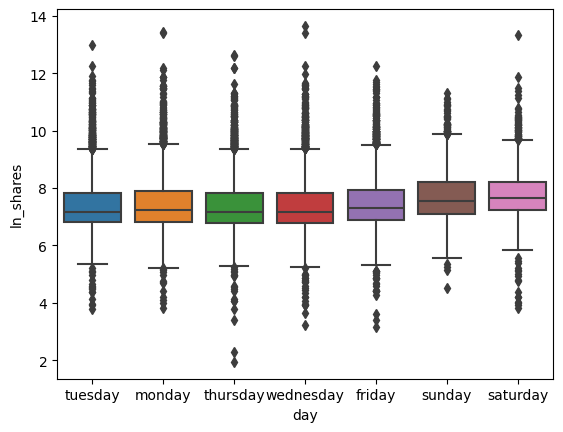

In [ ]:
sns.boxplot(df, x = 'day', y = 'ln_shares'  )

c:\Users\juand\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



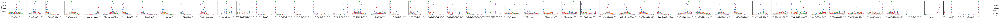

In [ ]:
sns.pairplot(data=df, x_vars = df.columns, y_vars= 'ln_shares' , hue= 'day'  )

#### Log-transformed target variable vs product category boxplot

We created another boxplot that shows the distribution of numerical values between ln_shares vs product category and Pairplot highlighting the category.

<Axes: xlabel='product_category', ylabel='ln_shares'>

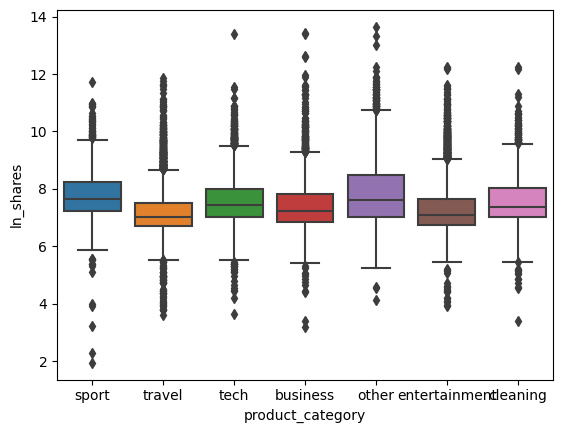

In [ ]:
sns.boxplot(df, x = 'product_category', y = 'ln_shares'  )

c:\Users\juand\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



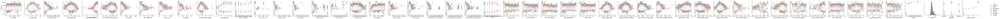

In [ ]:
sns.pairplot(data=df, x_vars = df.columns, y_vars= 'ln_shares' , hue= 'day'  )

#### Correlation matrix

Our next explaratory analysis aproach was by creating a correlation matrix to evaluate the relationship between two variables of our dataset. The matrix is a table in which every cell contains a correlation coefficient, where 1 is considered a strong relationship between variables, 0 a neutral relationship and -1 a not strong relationship.


In [ ]:
# all columns with numerical values
num_columns = ['age_days', ' n_tokens_title', ' n_tokens_review', ' n_unique_tokens',
       ' n_non_stop_words', ' n_non_stop_unique_tokens', ' num_hrefs',
       ' num_self_hrefs', ' num_imgs', ' num_videos', ' average_token_length',
       ' num_keywords', ' kw_min_min', ' kw_max_min',
       ' kw_avg_min', ' kw_min_max', ' kw_max_max', ' kw_avg_max',
       ' kw_min_avg', ' kw_max_avg', ' kw_avg_avg',
       ' self_reference_min_shares', ' self_reference_max_shares',
       ' self_reference_avg_sharess', 'topic_quality', 'topic_shipping',
       'topic_packaging', 'topic_description', 'topic_others',
       ' global_subjectivity', ' global_sentiment_polarity',
       ' global_rate_positive_words', ' global_rate_negative_words',
       ' rate_positive_words', ' rate_negative_words',
       ' avg_positive_polarity', ' min_positive_polarity',
       ' max_positive_polarity', ' avg_negative_polarity',
       ' min_negative_polarity', ' max_negative_polarity',
       ' title_subjectivity', ' title_sentiment_polarity',
       ' shares','ln_shares']

##### Store numerical variables in separate dataframe

In [ ]:
# creating a dataframe with all the numerical columns
df_num = df[num_columns].copy()

#### Look at statistical summary of the features

In [ ]:
df_num.describe().T

,count,mean,std,min,25%,50%,75%,max
age_days,28000.0,360.376286,2.125589e+02,8.000000,175.000000,348.000000,547.000000,731.000000
n_tokens_title,28000.0,10.379679,2.106580e+00,2.000000,9.000000,10.000000,12.000000,20.000000
n_tokens_review,28000.0,559.612036,4.640245e+02,18.000000,258.000000,420.000000,728.000000,8474.000000
n_unique_tokens,28000.0,0.547309,1.024567e-01,0.123422,0.477454,0.543549,0.611805,1.000000
n_non_stop_words,28000.0,1.000000,4.052939e-09,1.000000,1.000000,1.000000,1.000000,1.000000
n_non_stop_unique_tokens,28000.0,0.693451,1.010963e-01,0.119134,0.632627,0.693603,0.757404,1.000000
num_hrefs,28000.0,11.229857,1.142456e+01,0.000000,5.000000,8.000000,14.000000,304.000000
num_self_hrefs,28000.0,3.382214,3.812180e+00,0.000000,1.000000,3.000000,4.000000,74.000000
num_imgs,28000.0,4.558214,8.275950e+00,0.000000,1.000000,1.000000,4.000000,128.000000
num_videos,28000.0,1.261143,4.214034e+00,0.000000,0.000000,0.000000,1.000000,91.000000


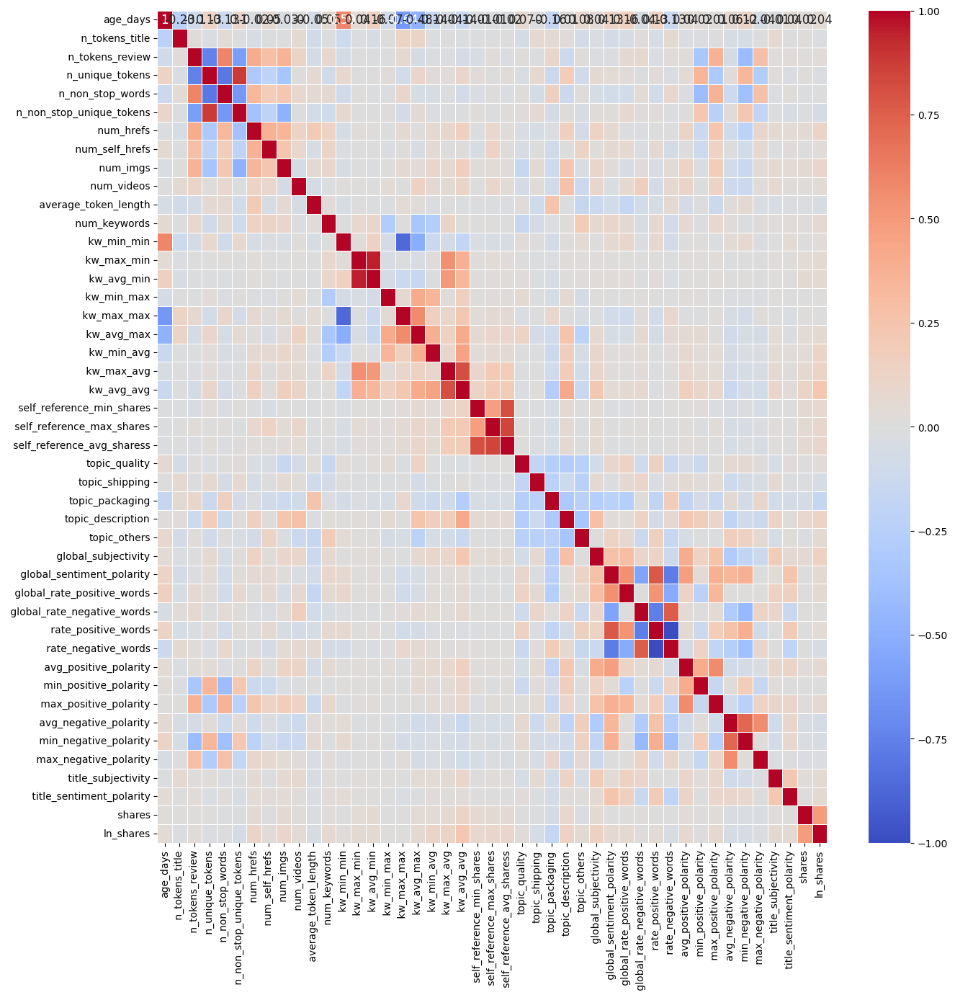

In [ ]:

plt.figure(figsize = (15,15))
sns.heatmap(data= df_num.corr().round(2), cmap='coolwarm', linewidths=.5, annot=True, annot_kws={"size":12})
plt.show()

#### Histogram for each variable

Histograms are an easy and great way to view the distribution of all the numerical varables. From the histograms, each bin and bar height can indicate the frequency of the data points with a value within the corresponding bin. From our histograms, we could see that distributions in most cases were right skewed. Therefore, we had to use Log + 2 to reduce the skewness of distributions of the variables. 

array([[<Axes: title={'center': 'age_days'}>,
        <Axes: title={'center': ' n_tokens_title'}>,
        <Axes: title={'center': ' n_tokens_review'}>,
        <Axes: title={'center': ' n_unique_tokens'}>,
        <Axes: title={'center': ' n_non_stop_words'}>,
        <Axes: title={'center': ' n_non_stop_unique_tokens'}>,
        <Axes: title={'center': ' num_hrefs'}>],
       [<Axes: title={'center': ' num_self_hrefs'}>,
        <Axes: title={'center': ' num_imgs'}>,
        <Axes: title={'center': ' num_videos'}>,
        <Axes: title={'center': ' average_token_length'}>,
        <Axes: title={'center': ' num_keywords'}>,
        <Axes: title={'center': ' kw_min_min'}>,
        <Axes: title={'center': ' kw_max_min'}>],
       [<Axes: title={'center': ' kw_avg_min'}>,
        <Axes: title={'center': ' kw_min_max'}>,
        <Axes: title={'center': ' kw_max_max'}>,
        <Axes: title={'center': ' kw_avg_max'}>,
        <Axes: title={'center': ' kw_min_avg'}>,
        <Axes: title={'

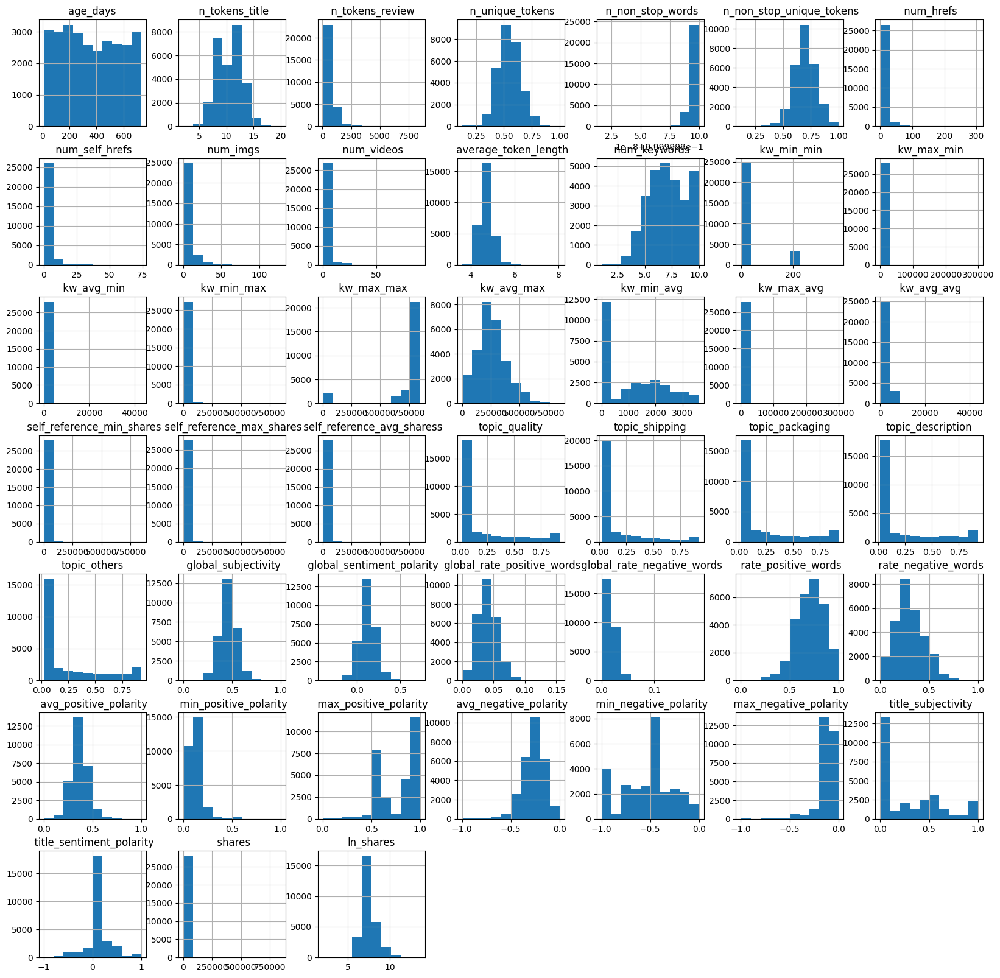

In [ ]:
df_num.hist(figsize=(20,20))

### Transform topics values
#### Tranform data to categorcial by rounding them

We wanted to analyze the effect of the topic values and if there is a realtionship between the logirthim of shares and topic values. As a result we started by rounding the values of the columns:
- topic_quality
- topic_shipping
- topic_packaging
- topic_descirption
- topic_others

Any percentage below 50% will be equal to 0.0 and equal or more than 50% will be 1.0.


In [ ]:
# Transforming percentages of topics to categorical data for analyzing
df_num[['topic_quality','topic_shipping','topic_packaging','topic_description','topic_others']].apply(lambda x: np.round(x))

,topic_quality,topic_shipping,topic_packaging,topic_description,topic_others
0,0.0,0.0,0.0,0.0,1.0
1,0.0,0.0,1.0,0.0,0.0
2,0.0,0.0,1.0,0.0,0.0
3,0.0,0.0,1.0,0.0,0.0
4,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...
27995,0.0,0.0,0.0,1.0,0.0
27996,1.0,0.0,0.0,0.0,0.0
27997,0.0,0.0,0.0,0.0,0.0
27998,0.0,0.0,1.0,0.0,0.0


In [ ]:
# create a new dataframe for the categorcial values
new_Cats = df_num[['topic_quality','topic_shipping','topic_packaging','topic_description','topic_others']].apply(lambda x: np.round(x))

In [ ]:
# Create a new column for the total of the categorical values
new_Cats['n'] = new_Cats['topic_quality'] + new_Cats['topic_shipping'] + \
                new_Cats['topic_packaging'] + new_Cats['topic_description'] + new_Cats['topic_others'] 

In [ ]:
df_quality = new_Cats[ new_Cats['topic_quality'] == 1].copy()
df_shipping = new_Cats[ new_Cats['topic_shipping'] == 1].copy()
df_packaging = new_Cats[ new_Cats['topic_packaging'] == 1].copy()
df_description = new_Cats[ new_Cats['topic_description'] == 1].copy()
df_others = new_Cats[ new_Cats['topic_others'] == 1].copy()
df_none = new_Cats[ new_Cats['n'] == 0].copy()

In [ ]:
# Create a dataframe for each topic
df_quality['topic'] =  "quality"
df_shipping['topic'] =  "shipping"
df_packaging['topic'] =  "packaging"
df_description['topic'] =  "description"
df_others['topic'] =  "others"
df_none['topic'] =  "none"

In [ ]:
# Merge all topic dataframes
topics = pd.concat([df_quality, df_shipping, df_packaging, df_description, df_others, df_none], axis= 0)['topic'].sort_index()

In [ ]:
df_num['topc'] = topics

#### Categorcial Topics Boxplot
We created another boxplot that shows the distribution of numerical values between ln_shares vs protopic and Pairplot highlighting the category.

<Axes: xlabel='topc', ylabel='ln_shares'>

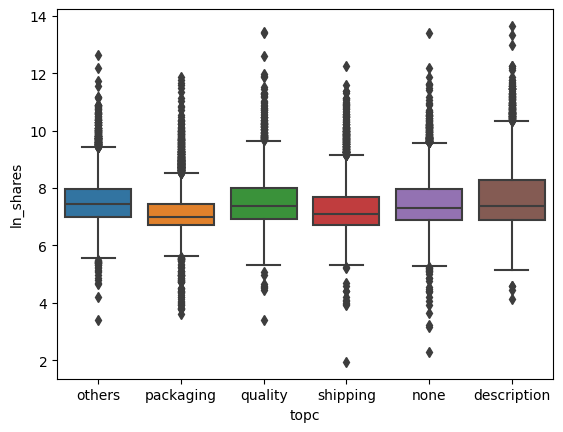

In [ ]:
# Create a Boxplot for comapring shares to categorical topics
sns.boxplot(df_num, x = 'topc', y = 'ln_shares'  )

c:\Users\juand\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



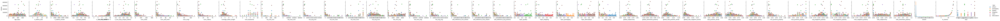

In [ ]:
x = df_num.columns.isin([ 'day','product_category' ])
sns.pairplot(data=df_num.iloc[:,~x], x_vars = df_num.iloc[:,~x].columns, y_vars= ' shares' , hue= 'topc'  )

#### Histogram of categorical topics
Take the logarithm of all topic values to amplify space between points in left skew variables.

array([[<Axes: title={'center': ' n_tokens_title'}>,
        <Axes: title={'center': ' n_tokens_review'}>,
        <Axes: title={'center': ' n_unique_tokens'}>,
        <Axes: title={'center': ' n_non_stop_words'}>,
        <Axes: title={'center': ' n_non_stop_unique_tokens'}>,
        <Axes: title={'center': ' num_hrefs'}>,
        <Axes: title={'center': ' num_self_hrefs'}>],
       [<Axes: title={'center': ' num_imgs'}>,
        <Axes: title={'center': ' num_videos'}>,
        <Axes: title={'center': ' average_token_length'}>,
        <Axes: title={'center': ' num_keywords'}>,
        <Axes: title={'center': ' kw_min_min'}>,
        <Axes: title={'center': ' kw_max_min'}>,
        <Axes: title={'center': ' kw_avg_min'}>],
       [<Axes: title={'center': ' kw_min_max'}>,
        <Axes: title={'center': ' kw_max_max'}>,
        <Axes: title={'center': ' kw_avg_max'}>,
        <Axes: title={'center': ' kw_min_avg'}>,
        <Axes: title={'center': ' kw_max_avg'}>,
        <Axes: title

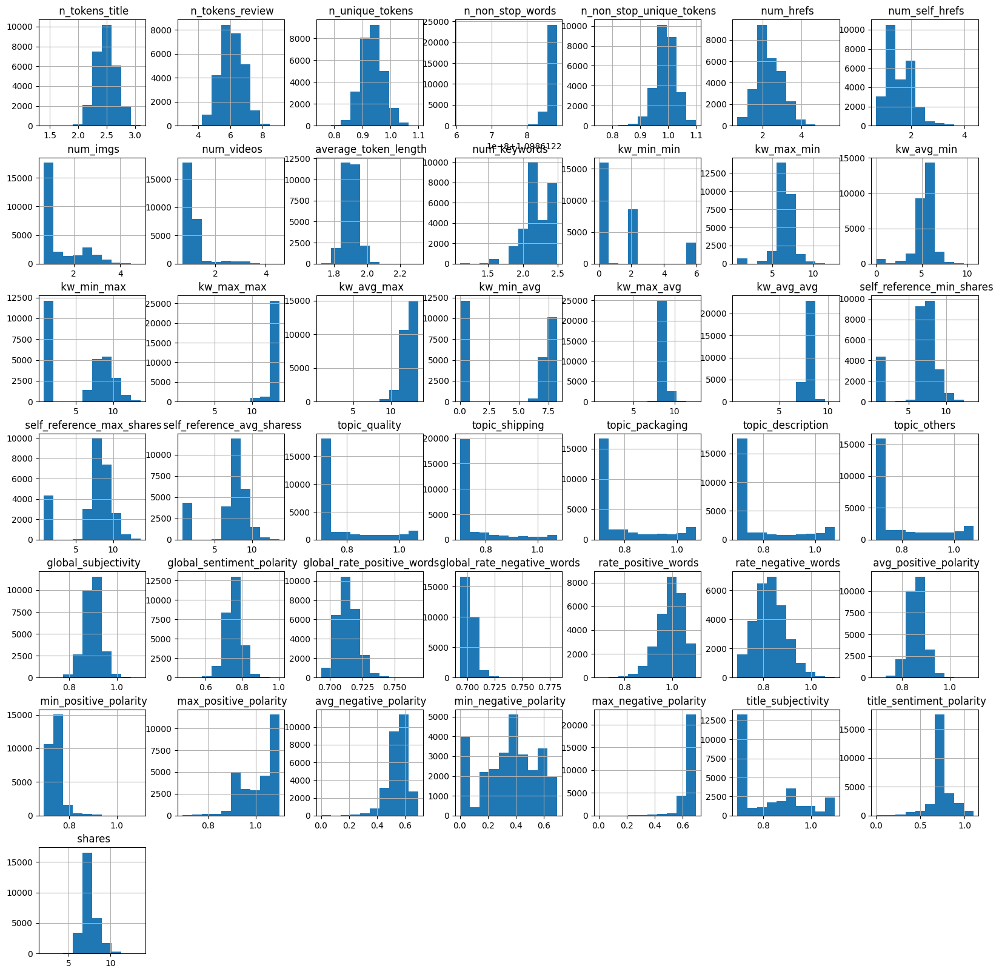

In [ ]:
#Log + 2 all categorical topic values
df_num.iloc[:,1:-2].apply(lambda x:np.log(x + 2)).hist(figsize=(20,20))

In [ ]:
# Perfom log + 2 on all values in dataset
df_num.iloc[:,1:-2].apply(lambda x:np.log(x + 2))

,n_tokens_title,n_tokens_review,n_unique_tokens,n_non_stop_words,n_non_stop_unique_tokens,num_hrefs,num_self_hrefs,num_imgs,num_videos,average_token_length,...,rate_negative_words,avg_positive_polarity,min_positive_polarity,max_positive_polarity,avg_negative_polarity,min_negative_polarity,max_negative_polarity,title_subjectivity,title_sentiment_polarity,shares
0,2.397895,6.280396,0.901081,1.098612,0.953366,2.197225,2.197225,1.098612,0.693147,1.914820,...,0.810930,0.875679,0.759105,1.098612,0.598531,0.559616,0.628609,0.916291,0.916291,7.697121
1,2.890372,6.921658,0.894555,1.098612,0.970063,1.791759,1.386294,1.609438,2.564949,1.854320,...,0.855666,0.918072,0.741937,1.064711,0.519400,0.000000,0.667829,0.717840,0.654926,6.706862
2,2.639057,6.230481,0.934743,1.098612,0.990764,2.302585,1.609438,1.386294,1.098612,1.942233,...,0.952658,0.779290,0.717840,0.916291,0.534908,0.223144,0.641854,0.693147,0.693147,6.909753
3,2.564949,5.493061,0.933711,1.098612,0.974050,1.945910,1.791759,1.098612,1.098612,1.933384,...,0.693147,0.852571,0.759105,0.993252,0.693147,0.693147,0.693147,0.693147,0.693147,6.495266
4,2.564949,6.892642,0.877937,1.098612,0.953489,2.564949,2.197225,1.098612,1.098612,1.839596,...,0.830769,0.850812,0.741937,1.098612,0.555905,0.182322,0.667829,0.693147,0.693147,6.909753
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27995,2.397895,5.375278,0.898289,1.098612,0.880634,3.806662,1.609438,2.564949,0.693147,2.117268,...,0.762140,0.920093,0.788457,1.098612,0.510826,0.510826,0.510826,0.693147,0.693147,8.909506
27996,2.302585,5.337538,0.973449,1.098612,1.047754,1.945910,1.609438,0.693147,1.098612,1.909183,...,0.810930,0.851402,0.741937,0.916291,0.320472,0.000000,0.606136,0.897942,0.759105,8.716372
27997,2.564949,6.989335,0.930235,1.098612,0.997918,3.526361,3.367296,2.564949,1.098612,1.895873,...,0.895174,0.885003,0.741937,1.098612,0.467309,0.000000,0.667829,0.693147,0.693147,7.091742
27998,2.639057,6.708084,0.896998,1.098612,0.949791,2.639057,0.693147,1.386294,0.693147,1.907410,...,0.829723,0.836545,0.741937,0.993252,0.537143,0.095310,0.641854,0.693147,0.693147,7.091742


#### Correct left skeweness with logarithm throughout the dataset and create new dataframe 

In [ ]:
dataset = df_num.iloc[:,1:-2].apply(lambda x:np.log(x + 2))
dataset = dataset.iloc[:, ~dataset.columns.isin(['topic_quality', 'topic_shipping','topic_packaging','topic_description','topic_others' ])]
dataset['age_days'] = df['age_days']
dataset[cat_columns]= df[cat_columns]
dataset['topic'] = topics

#### Correlation of all features (excluding topics) and target variable
1. Compare correlatios before and after transformation in target variable
2. No correlations accentuated by the transformation

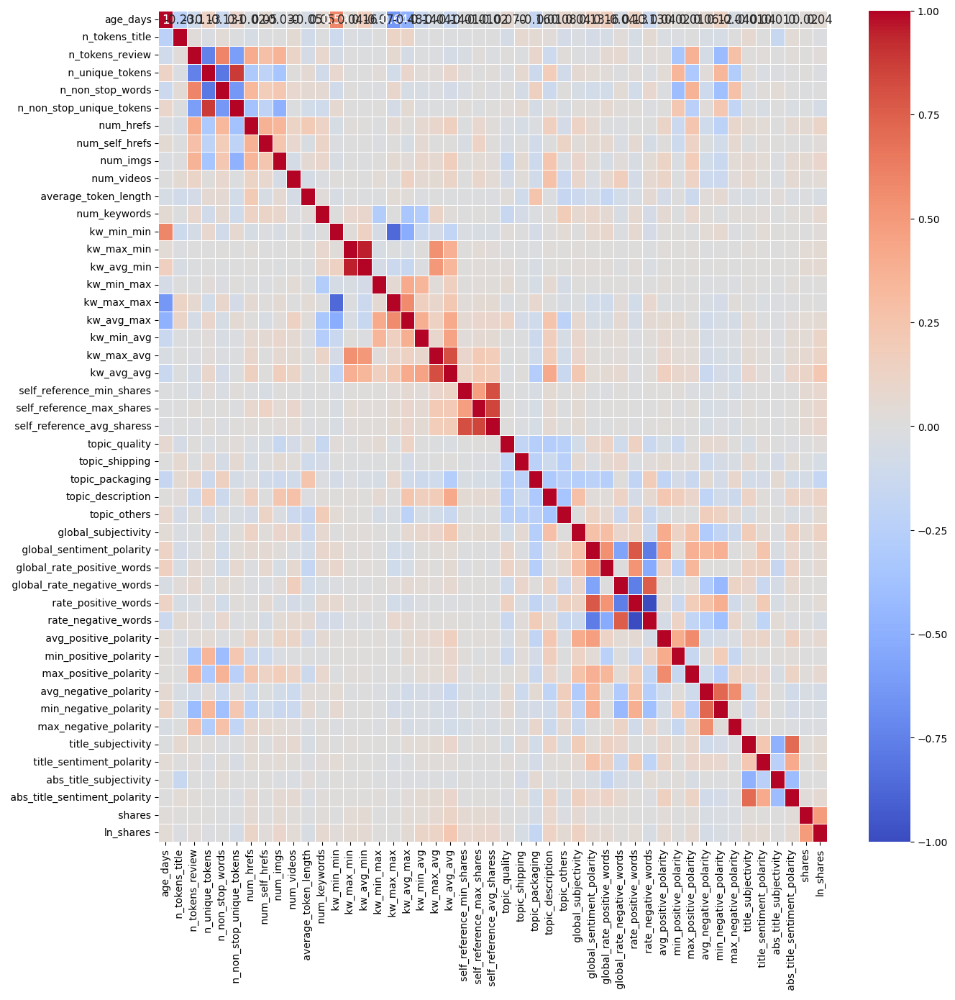

In [ ]:
x = df.columns.isin([ 'day','is_positive','shares_group','product_category' ])

plt.figure(figsize = (15,15))
sns.heatmap(data= df.iloc[:,~x].corr().round(2), cmap='coolwarm', linewidths=.5, annot=True, annot_kws={"size":12})
plt.show()

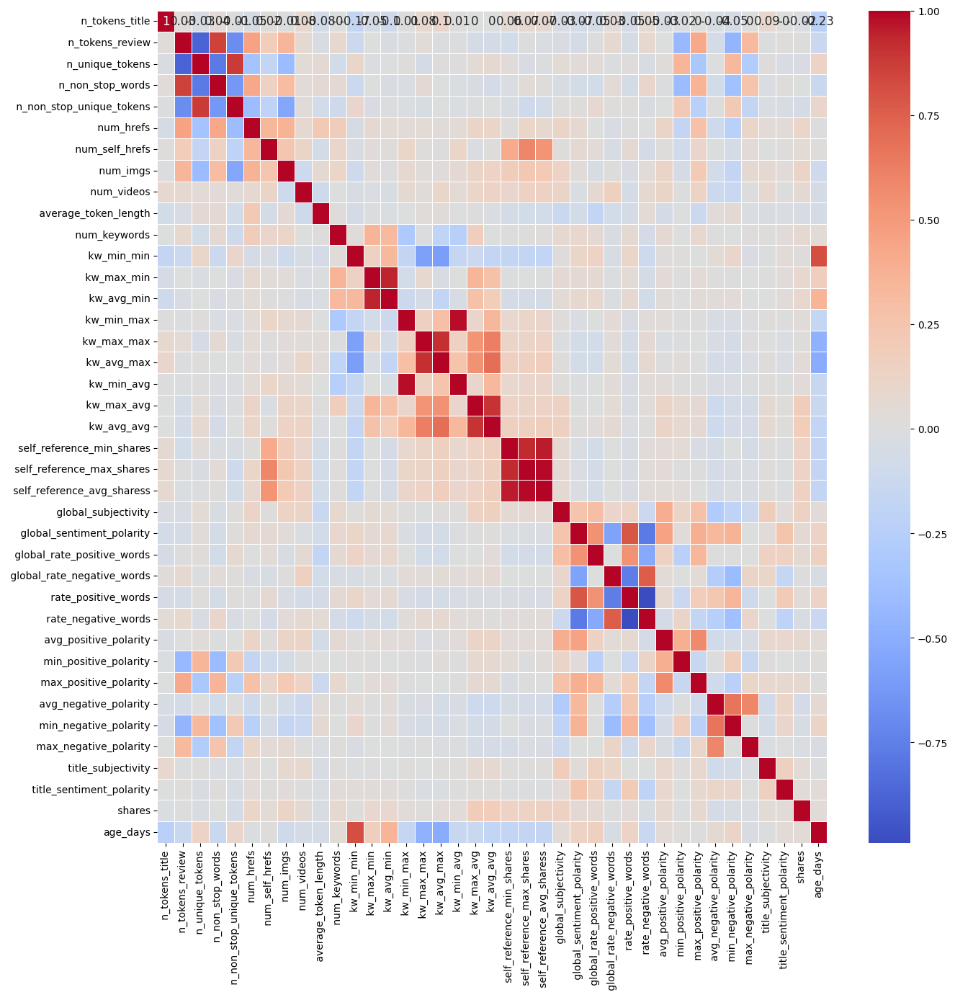

In [ ]:
x = dataset.columns.isin([ 'day','is_positive','topic','shares_group','product_category' ])

plt.figure(figsize = (15,15))
sns.heatmap(data= dataset.iloc[:,~x].corr().round(2), cmap='coolwarm', linewidths=.5, annot=True, annot_kws={"size":12})
plt.show()

# Investigate Positive and negative
1. Exploring polarities

In [ ]:
import plotly.graph_objects as go

x0 = df[' avg_positive_polarity'].values
x1 = df[' avg_negative_polarity'].values
x2 = df[' global_sentiment_polarity'].values


fig = go.Figure()
fig.add_trace(go.Histogram(x=x0))
fig.add_trace(go.Histogram(x=x1))
fig.add_trace(go.Histogram(x=x2))

# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

# Shares categorization exploration 

In [ ]:
# Define the number of groups
num_groups = 7

df.sort_values(' shares', inplace= True)

# Calculate the group size
group_size = len(df) // num_groups

# Assign groups
df['shares_group'] = [i // group_size for i in range(len(df))]

# Display the DataFrame
summary = df.groupby('shares_group').agg(
        mean_Shares=pd.NamedAgg(column=' shares', aggfunc="mean"),
        min_Shares=pd.NamedAgg(column=' shares', aggfunc="min"),
        max_Shares=pd.NamedAgg(column=' shares', aggfunc="max"),
        count=pd.NamedAgg(column=' shares', aggfunc="count")
        
    )  

summary['range'] = summary['max_Shares'] - summary['min_Shares']
summary


,mean_Shares,min_Shares,max_Shares,count,range
shares_group,,,,,
0,609.16850,5,781,4000,776
1,888.76500,781,998,4000,217
2,1120.59650,999,1300,4000,301
3,1440.65000,1300,1700,4000,400
4,1991.62500,1700,2400,4000,700
5,3267.47500,2400,4500,4000,2100
6,14539.34925,4500,843300,4000,838800


<Axes: xlabel='shares_group', ylabel='ln_shares'>

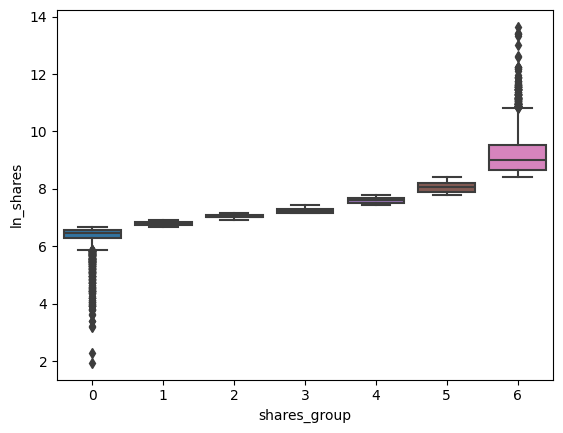

In [ ]:
# Create a Boxplot for comapring shares to categorical topics
sns.boxplot(df, x = 'shares_group', y = 'ln_shares'  )

In [ ]:
dataset['shares_group'] = df['shares_group']

c:\Users\juand\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



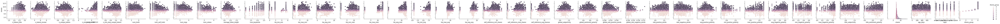

In [ ]:
x = dataset.columns.isin([ 'day', 'product_category' ])
sns.pairplot(data=dataset.iloc[:,~x], x_vars = dataset.iloc[:,~x].columns, y_vars= ' shares' , hue= 'shares_group'  )

# Train Test split

In [ ]:
df = pd.read_csv('model.csv')
cat_list = ["product_category", "day"]
num_list = [item for item in df.columns.tolist() if item not in cat_list]

# Separate categorical and numerical features
df_cat = df[cat_list].copy()
df_num = df[num_list].copy().iloc[:,:-1]

# Generate dummy features
dummies = pd.get_dummies(df_cat,dtype=int)

# Create X Variable joining both numerical and dummy variables
X = pd.concat([dummies, df_num], axis = 1)

# log transform target variable
y= df[' shares'].apply(lambda x: math.log(x+1))

# Split dataset
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size =0.3, random_state=42)

# Scale predictive variables
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

num_l = df_num.columns

# Scale only numerical
X_train[num_l] = scaler.fit_transform(X_train[num_l])
X_test[num_l] = scaler.transform(X_test[num_l])

X_train.shape

## Model
### Feature selection using RFECV

Due to the dataset having many values, we found that the best approach is to use feature selection to choose unique features of the data to best predict unknown values. We implement this using recursive feature elimination with cross-validation to select features. The number of features selected is tuned automatically by fitting an RFE selector on the different cross-validation splits (provided by the cv parameter).

Parameters:
1. Regressor
2. Step: the number of features to remove at each iteration
3. cv: determines the cross-validation splitting stratgey. In our case we use 5-folds cross-validation
4. n_jobs: Number of cores to run in parallel while fitting across folds, we use -1 which means that we are using all processors

In [ ]:
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LinearRegression

regressor = LinearRegression()
selector = RFECV(regressor, step=1, cv=5, n_jobs=-1)
selector = selector.fit(X_train, y_train)


X_train = selector.transform(X_train)
X_test = selector.transform(X_test)

X_train.shape

### GridSearchCV 

We use GridSearchCV which is an exhuastive search over specified parameter values for an estimator. The parameters of the estimator used to apply these methods are optimized by cross-validated grid-search over a parameter grid.

Parameters:
1. Model
2. par: model parameters
3. cv: cross-validation generator, 5-fold cross validation
4. scoring: strategy to evaluate the performance of the cross-validated model on the test set, set on "neg_mean_absolute_error"
5. n_jobs: Number of cores to run in parallel while fitting across folds, we use -1 which means that we are using all processors

Evaluation Criteria:
- Mean Absolute Error (MAE):  the average of the absolute error values
- Mean Squared Error (MSE): the mean or average of the squared differences between predicted and expected target values in a dataset.
- Root Mean Squared Error (RMSE): the square root of the MSE
- r2:


In [ ]:
from sklearn.model_selection import GridSearchCV
import math

def gs_regression(model, par) :
    gs = GridSearchCV(model, par,cv=5,scoring ='neg_mean_absolute_error',n_jobs=-1) 
    gs = gs.fit(X_train,y_train)

    #summarize the results of your GRIDSEARCH
    print('***GRIDSEARCH RESULTS***')
    print("Best score: %f using %s" % (gs.best_score_, gs.best_params_))
    means = gs.cv_results_['mean_test_score']
    stds = gs.cv_results_['std_test_score']
    params = gs.cv_results_['params']
    #for mean, stdev, param in zip(means, stds, params):
    #    print("%f (%f) with: %r" % (mean, stdev, param))
    
    y_pred_train=gs.predict(X_train)
    y_pred_test=gs.predict(X_test) 
    
    y_train_exp=y_train.apply(lambda x: math.exp(x)-1)
    y_test_exp=y_test.apply(lambda x: math.exp(x)-1)
    y_pred_train_exp=np.exp(y_pred_train)-1
    y_pred_test_exp=np.exp(y_pred_test)-1
    
            
    from sklearn import metrics
    print(X_train.shape)
    print()
    print("MAE  train %.3f (%f)  test %.3f (%f)" % (metrics.mean_absolute_error(y_train, y_pred_train), metrics.mean_absolute_error(y_train_exp, y_pred_train_exp) ,metrics.mean_absolute_error(y_test, y_pred_test),  metrics.mean_absolute_error(y_test_exp, y_pred_test_exp)  ) )
    print("MSE  train %.3f              test %.3f" % (metrics.mean_squared_error(y_train, y_pred_train), metrics.mean_squared_error(y_test, y_pred_test)) ) 
    print("RMSE train %.3f              test %.3f" % (np.sqrt(metrics.mean_squared_error(y_train, y_pred_train)), np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))) ) 
    print("r2   train %.3f              test %.3f" % (metrics.r2_score(y_train, y_pred_train), metrics.r2_score(y_test, y_pred_test)) )

### Gradient boosting as the model

xgboost is an optimized gradient boosting algorithm used as the regressor in our case on our train and test data to find the best results to predict new data. 

Parameters:
1. max_depth: Maximum depth of a tree. Increasing this value will make the model more complex and more likely to overfit. We chose to have a value of [5,4,3] and the model will choose the best
2. learning_rate: a multiplier between 0 and 1 that scales the prediction of each weak learner. With a value of either [0.05,0.01]
3. subsample:The subsample parameter controls the fraction of observations used for each tree. A smaller subsample value results in smaller and less complex models, which can help prevent overfitting. A larger subsample value results in larger and more complex models, which can lead to overfitting. We chose it to be 1
4. n_estimators: controls the number of trees in the model. We chose it be one of [300,400,500]

In [ ]:
import xgboost as xgb

regressor = xgb.XGBRegressor()

parameters = {
    'max_depth': [5,4,3],
    'learning_rate': [0.05,0.01],
    'subsample': [1],
    'n_estimators': [300,400,500],    
    'subsample': [0.66]   
}

gs_regression(regressor,parameters)

## Prediction

In [ ]:
import pandas as pd
import math
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFECV
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV
import joblib  # For model serialization (if you're using scikit-learn <= 0.23)
# from sklearn import joblib  # For model serialization (if you're using scikit-learn >= 0.24)
import xgboost as xgb

# Load the data
df = pd.read_csv('model.csv')
df.head()
# Define categorical and numerical features
cat_list = ["product_category", "day"]
num_list = [item for item in df.columns.tolist() if item not in cat_list]

# Separate categorical and numerical features
df_cat = df[cat_list].copy()
df_num = df[num_list].copy().iloc[:,:-1]

# Generate dummy features
dummies = pd.get_dummies(df_cat, dtype=int)

# Create X Variable joining both numerical and dummy variables
X = pd.concat([dummies, df_num], axis=1)

# log transform target variable
y = df[' shares'].apply(lambda x: math.log(x+1))

# Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Scale predictive variables
scaler = StandardScaler()
num_l = df_num.columns
# Scale only numerical features
X_train[num_l] = scaler.fit_transform(X_train[num_l])
X_test[num_l] = scaler.transform(X_test[num_l])

# Feature selection
regressor = LinearRegression()
selector = RFECV(regressor, step=1, cv=5, n_jobs=-1)
selector = selector.fit(X_train, y_train)

X_train = selector.transform(X_train)
X_test = selector.transform(X_test)

# Hyperparameter tuning
def gs_regression(model, par):
    gs = GridSearchCV(model, par, cv=5, scoring='neg_mean_absolute_error', n_jobs=-1)
    gs = gs.fit(X_train, y_train)

    # Summarize the results of your GRIDSEARCH
    print('***GRIDSEARCH RESULTS***')
    print("Best score: %f using %s" % (gs.best_score_, gs.best_params_))
    
    y_pred_train = gs.predict(X_train)
    y_pred_test = gs.predict(X_test) 
    
    y_train_exp = y_train.apply(lambda x: math.exp(x)-1)
    y_test_exp = y_test.apply(lambda x: math.exp(x)-1)
    y_pred_train_exp = np.exp(y_pred_train)-1
    y_pred_test_exp = np.exp(y_pred_test)-1
            
    from sklearn import metrics
    print(X_train.shape)
    print()
    print("MAE  train %.3f (%f)  test %.3f (%f)" % (metrics.mean_absolute_error(y_train, y_pred_train), metrics.mean_absolute_error(y_train_exp, y_pred_train_exp), metrics.mean_absolute_error(y_test, y_pred_test), metrics.mean_absolute_error(y_test_exp, y_pred_test_exp)))
    print("MSE  train %.3f              test %.3f" % (metrics.mean_squared_error(y_train, y_pred_train), metrics.mean_squared_error(y_test, y_pred_test)))
    print("RMSE train %.3f              test %.3f" % (np.sqrt(metrics.mean_squared_error(y_train, y_pred_train)), np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))))
    print("r2   train %.3f              test %.3f" % (metrics.r2_score(y_train, y_pred_train), metrics.r2_score(y_test, y_pred_test)))

parameters = {
    'max_depth': [5, 4, 3],
    'learning_rate': [0.05, 0.01],
    'subsample': [1],
    'n_estimators': [300, 400, 500],
    'subsample': [0.66]
}

regressor = xgb.XGBRegressor()
gs_regression(regressor, parameters)

# Save the trained model
joblib.dump(regressor, 'trained_regression_model.pkl')
joblib.dump(scaler,'trained_scaler.pkl')
joblib.dump(selector,'trained_selector.pkl')

In [ ]:
import pandas as pd
import math
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFECV
import joblib  # For model serialization (if you're using scikit-learn <= 0.23)
# from sklearn import joblib  # For model serialization (if you're using scikit-learn >= 0.24)

# Load the trained model
model = joblib.load('trained_regression_model.pkl')

# Load the scaler object
scaler = joblib.load('trained_scaler.pkl')  # Assuming you saved the scaler during training

# Load the selector object
selector = joblib.load('trained_selector.pkl')  # Assuming you saved the selector during training

# Load the new dataset
new_data = pd.read_csv('predictions.csv')

# Assume 'new_data' has the same preprocessing steps as your training data
cat_list = ["product_category", "day"]
num_list = [item for item in new_data.columns.tolist() if item not in cat_list]

# Separate categorical and numerical features
new_data_cat = new_data[cat_list].copy()
new_data_num = new_data[num_list].copy().iloc[:,:]

# Generate dummy features
new_dummies = pd.get_dummies(new_data_cat,dtype=int)

# Create X Variable joining both numerical and dummy variables
X_new = pd.concat([new_dummies, new_data_num], axis = 1)

# Scale numerical variables using the loaded scaler
num_l = new_data_num.columns
X_new[num_l] = scaler.transform(X_new[num_l])  # Use the loaded scaler for transformation

# Apply feature selection mask determined during training
X_new = X_new.iloc[:, selector.support_]

# Ensure that the model is fitted
if not hasattr(model, 'classes_'):
    model.fit(X_train, y_train)  # Assuming X_train and y_train are defined during training

# Make predictions
predictions = model.predict(X_new)

# If necessary, transform predictions back to original scale
predictions_exp = np.exp(predictions) - 1  # Assuming you log-transformed the target variable during training

# Add predictions to the new dataset
new_data['targets'] = predictions_exp

# Save or use the predictions
new_data.to_csv('test.csv', index=False)